For this project, I have two target variables and both numerical and categorical prediction variables. This means I will either use two models or a multilabel prediction model. I will be looking into CatBoost, LightGBM, and XGBoost. Pre-processing will consist mostly of triple-checking for null values, outlier treatment, and possible encoding for the LightGBM model (although this would result in very high dimensionality). For the regression models I will evaluate using mean squared error, mean absolute error, and R^2 score; for the classification models, I will use accuracy score, classification reports, and f1 score.

In [1]:
# I like having all my imports in one place
# It is a lot

# Basics
import pandas as pd
import numpy as np

# Pre-processing
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from category_encoders import TargetEncoder
from sklearn.compose import ColumnTransformer

# Models
from lightgbm import LGBMRegressor, LGBMClassifier
from catboost import CatBoostRegressor, CatBoostClassifier
import xgboost as xgb

# Model evaluation and metrics
from scipy.stats import randint, uniform
from sklearn.model_selection import (GridSearchCV, RandomizedSearchCV, cross_val_score, 
                                     KFold, StratifiedKFold)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics import classification_report, accuracy_score, f1_score
from sklearn.metrics import (roc_auc_score, average_precision_score, 
                             precision_recall_curve, average_precision_score, 
                             auc, make_scorer)

# For graphing
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

In [2]:
# Import the dataset, first

aac = pd.read_csv('aac_final.csv')
aac.head()

,OutcomeType,VisitLength,VisitDays,AnimalType,Breed,ColorGroup,AgeYears,AgeCategory,IntakeMonth
0,Return to Owner,0 days 07:48:00,0.325000,Dog,Border Terrier,White,7,Adult,10
1,Transfer,0 days 02:06:00,0.087500,Cat,Domestic Shorthair,Orange,0,Infant,10
2,Transfer,0 days 02:11:00,0.090972,Cat,Domestic Shorthair,Orange,0,Infant,10
3,Transfer,0 days 02:11:00,0.090972,Cat,Domestic Shorthair,Orange,0,Infant,10
4,Euthanasia,0 days 06:40:00,0.277778,Dog,American Pit Bull Terrier,Gray,3,Adult,10


In [3]:
# Check out columns

print(aac.columns)

Index(['OutcomeType', 'VisitLength', 'VisitDays', 'AnimalType', 'Breed',
       'ColorGroup', 'AgeYears', 'AgeCategory', 'IntakeMonth'],
      dtype='object')


In [4]:
# And drop extraneous--in this case 'AgeCategory', 
# since I will be using models which can handle numerical and categorical data
# And also 'VisitLength'

aac = aac.drop(columns = ['AgeCategory', 'VisitLength']).copy()
aac.head()

,OutcomeType,VisitDays,AnimalType,Breed,ColorGroup,AgeYears,IntakeMonth
0,Return to Owner,0.325000,Dog,Border Terrier,White,7,10
1,Transfer,0.087500,Cat,Domestic Shorthair,Orange,0,10
2,Transfer,0.090972,Cat,Domestic Shorthair,Orange,0,10
3,Transfer,0.090972,Cat,Domestic Shorthair,Orange,0,10
4,Euthanasia,0.277778,Dog,American Pit Bull Terrier,Gray,3,10


In [5]:
# Perfect, just the columns we want
# Now we rename that color column, since there is no other color column anymore

color_rename = {'ColorGroup' : 'Color'}
aac.rename(color_rename, axis = 1, inplace = True)

aac.head()

,OutcomeType,VisitDays,AnimalType,Breed,Color,AgeYears,IntakeMonth
0,Return to Owner,0.325000,Dog,Border Terrier,White,7,10
1,Transfer,0.087500,Cat,Domestic Shorthair,Orange,0,10
2,Transfer,0.090972,Cat,Domestic Shorthair,Orange,0,10
3,Transfer,0.090972,Cat,Domestic Shorthair,Orange,0,10
4,Euthanasia,0.277778,Dog,American Pit Bull Terrier,Gray,3,10


## Null Check

In [6]:
print(aac.isnull().sum())

OutcomeType    0
VisitDays      0
AnimalType     0
Breed          0
Color          0
AgeYears       0
IntakeMonth    0
dtype: int64


## Outlier Evaluation


The column I remember which had remaining outliers is VisitDays (AgeYears, Color, and Breed have already been cured of theirs, and AnimalType and OutcomeType didn't really have any). Since it is such a critical column, I must be careful dealing with these.

In [7]:
print(aac['VisitDays'].describe())

count    161604.000000
mean         21.977686
std          49.396850
min           0.000000
25%           2.389236
50%           6.205208
75%          21.250174
max        1912.938194
Name: VisitDays, dtype: float64


19,000 is a lot of days, especially since the 75th percentile is 21. I am going to look at how many entries are above this percentile.

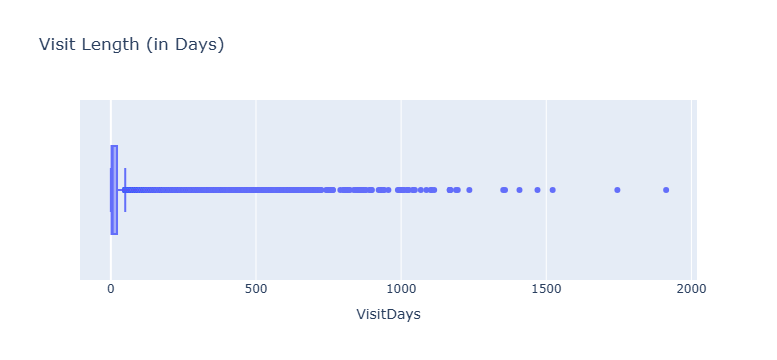

In [8]:
# Let's graph it, and since it is so skewed I am going to use plotly for ease of examination

fig = px.box(
    aac, 
    x = 'VisitDays', 
    title = f'Visit Length (in Days)'
)
fig.show()

That's a lot of outliers. It looks like after 750, though, they seem to teeter off. The upper fence of this graph is just under 50 days, and the median is 6. Since those extended stays are still important to the goal of this project, though, I'm going to be cautious and look at stays over 1000 days to start.

In [9]:
aac[aac['VisitDays'] > 1000]

,OutcomeType,VisitDays,AnimalType,Breed,Color,AgeYears,IntakeMonth
3408,Adoption,1101.784028,Cat,Domestic Shorthair,Brown Tabby,10,12
7675,Adoption,1067.829861,Cat,Domestic Shorthair,Brown Tabby,8,4
26107,Adoption,1009.966667,Dog,Labrador Retriever,Tan,12,4
26889,Adoption,1469.714583,Cat,Domestic Shorthair,Brown Tabby,10,5
31350,Adoption,1407.689583,Cat,Domestic Shorthair,Orange Tabby,5,7
32680,Adoption,1026.885417,Dog,Labrador Retriever,Black,10,8
39286,Adoption,1912.938194,Dog,American Pit Bull Terrier,White,11,1
41206,Adoption,1001.057639,Dog,Chihuahua,Tan,7,2
42260,Adoption,1521.979861,Dog,American Pit Bull Terrier,Black/White,5,3
53222,Transfer,1351.847222,Dog,Labrador Retriever,Black/White,6,11


In [10]:
# That's 30 entries
# How about 2 years?

aac[aac['VisitDays'] > 730]

,OutcomeType,VisitDays,AnimalType,Breed,Color,AgeYears,IntakeMonth
2510,Adoption,806.995833,Dog,American Bulldog,Black/White,3,11
3408,Adoption,1101.784028,Cat,Domestic Shorthair,Brown Tabby,10,12
7675,Adoption,1067.829861,Cat,Domestic Shorthair,Brown Tabby,8,4
7784,Adoption,997.879861,Dog,German Shepherd,Black,9,4
15272,Adoption,938.098611,Dog,Labrador Retriever,Sable,12,8
...,...,...,...,...,...,...,...
131890,Adoption,813.286111,Dog,American Pit Bull Terrier,Gray,4,6
132624,Adoption,927.931250,Dog,Bulldog,Gray,3,7
132727,Adoption,930.791667,Dog,American Pit Bull Terrier,Black/White,7,7
134097,Adoption,868.725694,Dog,Anatolian Shepherd,White,3,8


I'm willing to exempt the true values from 74 rows. I think capping this at 2 years isn't too bad, to start. Let's do that.

In [11]:
# Cap that max

aac['VisitDays'] = aac['VisitDays'].clip(upper=730).copy()

In [12]:
# Check it worked

aac['VisitDays'].describe()

count    161604.000000
mean         21.857603
std          47.068102
min           0.000000
25%           2.389236
50%           6.205208
75%          21.250174
max         730.000000
Name: VisitDays, dtype: float64

Interestingly, that hardly changed our summary stats at all. However, since those long visits are so important to the goal of this projet, I am going to deal with them differently--I will transform this to a log scale for modeling (once I have split the data), then un-log it for interpretation after predictions have been made.

The other one I am going to look at is OutcomeType, although I won't balance the dataset for it, lest I lose the significance of the minority. I would like to see what degree of majority Adoption holds, though.

In [13]:
print(aac['OutcomeType'].value_counts())

OutcomeType
Adoption           82235
Transfer           46488
Return to Owner    26608
Euthanasia          4912
Died                1361
Name: count, dtype: int64


I think in this case, actually, I will make this a binary classification problem, focusing on the categories "Euthanasia" and "Died". Adoptions are important but will happen regardless; however, predicting which animals are most at-risk could save lives. This will be handled during our X/y split, though.

## Split & Transformation

In [14]:
# Establish X and y (both time and type of outcome)

X_reg = aac[['AnimalType', 'Breed', 'Color', 'AgeYears', 'IntakeMonth']]  # For regressors
X_clf = aac[['AnimalType', 'Breed', 'Color', 'AgeYears', 'IntakeMonth']]  # Separate variable names to maintain consistency with separate 'y' variables

y_reg = aac['VisitDays']  # For the regression models

risk_outcomes = ['Euthanasia', 'Died']  # Making this a binary classification problem
y_clf = aac['OutcomeType'].isin(risk_outcomes).astype(int)  # For the classification models, focusing on high-risk outcomes

In [15]:
# Label encode y for models which need numerical labels

y_clf = LabelEncoder().fit_transform(y_clf)  # Same variable for simplicity later

In [16]:
# Split both outcome type (encoded) and time, with a test size of 20%

X_reg_train, X_reg_test, y_reg_train, y_reg_test = train_test_split(
    X_reg, y_reg, test_size = 0.2, random_state = 42)

X_clf_train, X_clf_test, y_clf_train, y_clf_test = train_test_split(
    X_clf, y_clf, test_size = 0.2, random_state = 42)

### Sample-Taking

In [17]:
# Sample 25% of regression data by abusing the same train_test_split equation

# Regression variables
X_reg_train_sample, _, y_reg_train_sample, _ = train_test_split(  # train
    X_reg_train, y_reg_train, train_size = 0.25, random_state = 42
)

X_reg_test_sample, _, y_reg_test_sample, _ = train_test_split(  # test
    X_reg_test, y_reg_test, train_size = 0.25, random_state = 42
)

# Classification variables
X_clf_train_sample, _, y_clf_train_sample, _ = train_test_split(  # train
    X_clf_train, y_clf_train, train_size = 0.25, random_state = 43
)

X_clf_test_sample, _, y_clf_test_sample, _ = train_test_split(  # test
    X_clf_test, y_clf_test, train_size = 0.25, random_state = 43
)

# Feedback
print("=== SAMPLING COMPLETE ===")
print(f"Regression: {len(X_reg_train_sample)} train, {len(X_reg_test_sample)} test")
print(f"Classification: {len(X_clf_train_sample)} train, {len(X_clf_test_sample)} test")
print(f"At-risk distribution: {np.bincount(y_clf_train_sample)}")

=== SAMPLING COMPLETE ===
Regression: 32320 train, 8080 test
Classification: 32320 train, 8080 test
At-risk distribution: [31097  1223]


### Encoding

Now for some more encoding of variables. I will use target encoding for Breed and Color (or switch to label encoding if that causes overfitting) and one-hot encoding for AnimalType. I will also use label encoding on my y variables.

In [18]:
# One-hot encoding for AnimalType

X_reg_train_encoded = pd.get_dummies(X_reg_train, 
                                     columns = ['AnimalType'], 
                                     drop_first = True)
X_clf_train_encoded = pd.get_dummies(X_clf_train, 
                                     columns = ['AnimalType'], 
                                     drop_first = True)

X_reg_test_encoded = pd.get_dummies(X_reg_test, 
                                    columns = ['AnimalType'], 
                                    drop_first = True)
X_clf_test_encoded = pd.get_dummies(X_clf_test, 
                                    columns = ['AnimalType'], 
                                    drop_first = True)

# Make sure columns match
X_reg_test_encoded = X_reg_test_encoded.reindex(columns = X_reg_train_encoded.columns, 
                                                fill_value = 0)
X_clf_test_encoded = X_clf_test_encoded.reindex(columns = X_clf_train_encoded.columns, 
                                                fill_value = 0)

# Also apply to our sample variables

X_reg_train_sample_encoded = pd.get_dummies(X_reg_train_sample, 
                                            columns = ['AnimalType'], 
                                            drop_first = True)
X_clf_train_sample_encoded = pd.get_dummies(X_clf_train_sample, 
                                            columns = ['AnimalType'], 
                                            drop_first = True)

X_reg_test_sample_encoded = pd.get_dummies(X_reg_test_sample, 
                                           columns = ['AnimalType'], 
                                           drop_first = True)
X_clf_test_sample_encoded = pd.get_dummies(X_clf_test_sample, 
                                           columns = ['AnimalType'], 
                                           drop_first = True)

# Make sure columns match
X_reg_test_sample_encoded = X_reg_test_sample_encoded.reindex(columns = X_reg_train_sample_encoded.columns, 
                                                              fill_value = 0) 
X_clf_test_sample_encoded = X_clf_test_sample_encoded.reindex(columns = X_clf_train_sample_encoded.columns, 
                                                              fill_value = 0)

In [19]:
# Target encoding (with cross-validation to prevent overfitting)

# Initialize encoder
reg_target_encoder = TargetEncoder(cols = ['Breed', 'Color'], 
                                   smoothing = 1.0)
clf_target_encoder = TargetEncoder(cols = ['Breed', 'Color'], 
                                   smoothing = 1.0)  # Just to ensure sure the different sets stay separate 

# Fit_transform to training data
X_reg_train_encoded2 = reg_target_encoder.fit_transform(X_reg_train_encoded, 
                                                        y_reg_train)
X_clf_train_encoded2 = clf_target_encoder.fit_transform(X_clf_train_encoded, 
                                                        y_clf_train)

# Just transform test data
X_reg_test_encoded2 = reg_target_encoder.transform(X_reg_test_encoded) 
X_clf_test_encoded2 = clf_target_encoder.transform(X_clf_test_encoded)

# Same for the samples

# Initialize new encoders
sample_reg_target_encoder = TargetEncoder(cols = ['Breed', 'Color'], 
                                          smoothing = 1.0)
sample_clf_target_encoder = TargetEncoder(cols = ['Breed', 'Color'], 
                                          smoothing = 1.0)

# Fit_transform to training data
X_reg_train_sample_encoded2 = sample_reg_target_encoder.fit_transform(X_reg_train_sample_encoded, 
                                                                      y_reg_train_sample)
X_clf_train_sample_encoded2 = sample_clf_target_encoder.fit_transform(X_clf_train_sample_encoded, 
                                                                      y_clf_train_sample)

# Transform test data
X_reg_test_sample_encoded2 = sample_reg_target_encoder.transform(X_reg_test_sample_encoded)
X_clf_test_sample_encoded2 = sample_clf_target_encoder.transform(X_clf_test_sample_encoded)

In [20]:
# The next cells will check what all of our X variables are looking like

X_reg_train_encoded2.head()

,Breed,Color,AgeYears,IntakeMonth,AnimalType_Dog
42950,11.646505,20.037309,2,4,True
26817,9.909292,18.872419,7,5,True
57698,9.909292,19.232029,1,2,True
76079,9.625438,20.037309,4,4,True
50635,23.562227,20.037309,1,9,False


In [21]:
X_clf_train_encoded2.head()

,Breed,Color,AgeYears,IntakeMonth,AnimalType_Dog
42950,0.029578,0.040407,2,4,True
26817,0.016688,0.027052,7,5,True
57698,0.016688,0.037535,1,2,True
76079,0.007092,0.040407,4,4,True
50635,0.051951,0.040407,1,9,False


In [22]:
# And our sample X's

X_reg_train_sample_encoded2.head()

,Breed,Color,AgeYears,IntakeMonth,AnimalType_Dog
131407,22.157298,19.084408,0,6,True
3649,10.952087,24.083198,1,12,True
139828,23.253208,24.081208,2,3,False
127314,22.157298,24.083198,5,1,True
42529,23.253208,23.585957,0,3,False


In [23]:
X_clf_train_sample_encoded2.head()

,Breed,Color,AgeYears,IntakeMonth,AnimalType_Dog
65020,0.022293,0.034512,5,7,True
133502,0.046344,0.037966,0,7,True
51626,0.060606,0.061688,0,9,False
66590,0.053571,0.039516,0,8,False
94068,0.052622,0.042744,1,5,False


In [24]:
# And X_test variables

X_reg_test_encoded2.head()

,Breed,Color,AgeYears,IntakeMonth,AnimalType_Dog
34745,23.562227,10.426231,0,9,False
27890,16.703407,15.163909,0,5,True
30918,27.074315,19.232029,0,7,True
38743,11.646505,19.232029,10,12,True
64204,11.646505,24.073063,0,7,True


In [25]:
X_clf_test_encoded2.head()

,Breed,Color,AgeYears,IntakeMonth,AnimalType_Dog
34745,0.051951,0.147945,0,9,False
27890,0.024793,0.016216,0,5,True
30918,0.015234,0.037535,0,7,True
38743,0.029578,0.037535,10,12,True
64204,0.029578,0.036614,0,7,True


In [26]:
# Samples again

X_reg_test_sample_encoded2.head()

,Breed,Color,AgeYears,IntakeMonth,AnimalType_Dog
34791,10.952087,20.589813,1,9,True
136382,35.443476,29.425769,9,11,True
124691,38.115119,17.660002,2,10,True
143877,23.253208,23.585957,3,7,False
103560,22.157298,20.589813,0,10,True


In [27]:
X_clf_test_sample_encoded2.head()

,Breed,Color,AgeYears,IntakeMonth,AnimalType_Dog
79066,0.020290,0.039459,0,6,True
19881,0.027829,0.030087,3,11,True
50285,0.036046,0.030087,10,8,True
103325,0.018924,0.030087,10,10,True
31128,0.052622,0.065495,0,7,False


In [28]:
# Log scale regression y's for training, since the distribution is so very skewed

y_reg_train = np.log1p(y_reg_train)  # Not changing the variable name, for simplicity
y_reg_test = np.log1p(y_reg_test)

# Samples again

y_reg_train_sample = np.log1p(y_reg_train_sample)
y_reg_test_sample = np.log1p(y_reg_test_sample)

In [29]:
# Resetting variables for simplicity and consistency later

# Full dataset
X_reg_train = X_reg_train_encoded2
X_clf_train = X_clf_train_encoded2
X_reg_test = X_reg_test_encoded2
X_clf_test = X_clf_test_encoded2

# Samples
X_reg_train_sample = X_reg_train_sample_encoded2
X_clf_train_sample = X_clf_train_sample_encoded2
X_reg_test_sample = X_reg_test_sample_encoded2
X_clf_test_sample = X_clf_test_sample_encoded2

In [30]:
# Change X categorical columns to 'category' type for XGBoost and LightGBM models
# I will set the categorical versions as the default, since most of the models will use this

# Set aside the categorical columns
cat_cols = ['AnimalType_Dog', 'Breed', 'Color']  

# Convert
X_reg_train[cat_cols] = X_reg_train_encoded2[cat_cols].astype('category')
X_reg_test[cat_cols] = X_reg_test_encoded2[cat_cols].astype('category')
X_clf_train[cat_cols] = X_clf_train_encoded2[cat_cols].astype('category') 
X_clf_test[cat_cols] = X_clf_test_encoded2[cat_cols].astype('category')
# Samples, too
X_reg_train_sample[cat_cols] = X_reg_train_sample_encoded2[cat_cols].astype('category')
X_reg_test_sample[cat_cols] = X_reg_test_sample_encoded2[cat_cols].astype('category')
X_clf_train_sample[cat_cols] = X_clf_train_sample_encoded2[cat_cols].astype('category') 
X_clf_test_sample[cat_cols] = X_clf_test_sample_encoded2[cat_cols].astype('category')

# Set aside a separate, string version of these categories for CatBoost models as well

# Create the dataframe copies to maintain all of the categories
X_reg_train_str = X_reg_train.copy()  # It's a lot of different dataframes
X_clf_train_str = X_clf_train.copy()
X_reg_test_str = X_reg_test.copy()
X_clf_test_str = X_clf_test.copy()
X_reg_train_sample_str = X_reg_train_sample.copy()
X_clf_train_sample_str = X_clf_train_sample.copy()
X_reg_test_sample_str = X_reg_test_sample.copy()
X_clf_test_sample_str = X_clf_test_sample.copy()

# Convert
X_reg_train_str[cat_cols] = X_reg_train[cat_cols].astype('str')
X_clf_train_str[cat_cols] = X_clf_train[cat_cols].astype('str')
X_reg_test_str[cat_cols] = X_reg_test[cat_cols].astype('str')
X_clf_test_str[cat_cols] = X_clf_test[cat_cols].astype('str')
# Samples as well
X_reg_train_sample_str[cat_cols] = X_reg_train_sample[cat_cols].astype('str')
X_clf_train_sample_str[cat_cols] = X_clf_train_sample[cat_cols].astype('str')
X_reg_test_sample_str[cat_cols] = X_reg_test_sample[cat_cols].astype('str')
X_clf_test_sample_str[cat_cols] = X_clf_test_sample[cat_cols].astype('str')

In [31]:
# Check our work once more

X_reg_train_sample.head()

,Breed,Color,AgeYears,IntakeMonth,AnimalType_Dog
131407,22.157298,19.084408,0,6,True
3649,10.952087,24.083198,1,12,True
139828,23.253208,24.081208,2,3,False
127314,22.157298,24.083198,5,1,True
42529,23.253208,23.585957,0,3,False


**Variables & Transformations:**  
**X_reg_train:**  
- "AnimalType" pandas dummied
- "Breed" and "Color" target encoded, 
- "AgeYears" and "IntakeMonth" left alone  
- Also string version (X_reg_train_str)

**X_reg_train_sample:**  
- Sampled (25% of original dataset)
- Otherwise same as X_reg_train  
- Also string version (X_reg_train_sample_str)

**X_clf_train:**  
- "AnimalType" pandas dummied
- "Breed" and "Color" target encoded
- "AgeYears" and "IntakeMonth" left alone  
- Also string version (X_clf_train_str)

**X_clf_train_sample:**  
- Sampled (25% original dataset)
- Columns synced with X_reg_train_sample
- Otherwise same as X_clf_train  
- Also string version (X_reg_train_sample_str)

**X_reg_test:** 
- "AnimalType" pandas dummied
- "Breed" and "Color" target encoded  
- Same as X_reg_train  
- Also string version (X_reg_test_str)

**X_reg_test_sample:** 
- Same as X_reg_train_sample  
- Also string version (X_reg_test_sample_str)

**X_clf_test:**  
- Same as X_reg_test  
- Also string version (X_clf_test_str)

**X_clf_test_sample:**  
- Same as X_reg_test_sample  
- Also string version (X_clf_test_sample_str)

**y_reg_train:**  
- Shifted to log scale  

**y_reg_train_sample:**  
- Log scaled  
- Sampled (25% of dataset)  

**y_clf_train:**  
- Label encoded  

**y_clf_train_sample:**  
- Label encoded
- Sampled (25% of dataset)

**y_reg_test:**
- Log scaled

**y_reg_test_sample:**
- Log scaled
- Sampled (25% of dataset)

**y_clf_test:**
- Label encoded

**y_clf_test_sample:** 
- Label encoded
- Sampled (25% of dataset)

# Modeling

## Setup

First, I'll define some functions to make this easier later.

In [32]:
# Quick tuning (RandomizedSearchCV) function

def quick_tune(model, param_grid, X_train, y_train, cv = 3, n_iter = 20, random = 42):
    """
    Quick tuning with given parameters.
    Automatically scores using NRMSE for regressors and weighted F1 for classifiers.
    Uses a provided regressor or classifier model with RandomizedSearchCV

    Params:
        model (var): pre-initiated model
        param_grid (dict): dictionary of relevant parameters and values for the Randomized Search to use
        X_train (var): name of X_training variable
        y_train (var): name of y_training variable
        n_iter (int): number of iterations for the Randomized Search to use
        random (int): change the random_state of the search if needed

    Returns:
        Random search results
        Printed feedback of best score and the corresponding parameters
    """
    
    # Preliminary feedback
    print(f"Quick tuning for {type(model).__name__} (testing {n_iter} combinations)...")
    print()
    
    # Define the model's name
    model_name = type(model).__name__
        
    if "Regressor" in model_name:  # Automatically apply NRMSE scoring to regressors
        
        print("Model type parsed: Regressor")  # Feedback
        print()
        
        random_search = RandomizedSearchCV(
            model, 
            param_grid, 
            cv = cv,
            n_iter = n_iter, 
            scoring = 'neg_root_mean_squared_error',
            n_jobs = -1,
            random_state = random
        )
        random_search.fit(X_train, y_train)
        
        # Feedback
        print(f"Best NRMSE score: {random_search.best_score_:.4f}")
        print(f"Best {type(model).__name__} parameters: {random_search.best_params_}")
        
    elif "Classifier" in model_name: # And automatically apply f1_weighted scoring to classifiers
        
        print("Model type parsed: Classifier")  # Feedback
        print()
        
        random_search = RandomizedSearchCV(
            model, 
            param_grid, 
            cv = cv,
            n_iter = n_iter, 
            scoring = 'f1_weighted',
            n_jobs = -1,
            random_state = random
        )
        random_search.fit(X_train, y_train)
        
        # Feedback
        print(f"Best Weighted F1 score: {random_search.best_score_:.4f}")
        print(f"Best {type(model).__name__} parameters: {random_search.best_params_}")
        
    else:
        print(f'Unable to parse {type(model).__name__} as "Regressor" or "Classifier"')
        print('Unable to tune model.')
    
    return random_search

In [33]:
# Regression evaluation function

def reg_eval(model, X_train, y_train, X_test, y_test, cv = 5):
    """
    CV R2, RMSE, and MAE + Train/Test comparison
    For regression model evaluation
    
    Params: 
        model: fitted regression model
        X_train: array of X values used for training
        y_train: 1-dimensional array of y values used for training
        X_test: array of X values unseen by model, for testing
        y_test: 1-dimensional array of y values unseen by model, for testing
        cv: int, number of folds to cross-validate
    
    Returns:
        printed feedback
        dictionary of metrics: R2, MAE, RMSE, and R2/RMSE train/test score comparisons and gaps
    """
    
    # R² scores
    r2 = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'r2')
    print(f"CV R²: {r2.mean():.3f} ± {r2.std():.3f}")
    
    # MAE scores (negative)
    nmae = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'neg_mean_absolute_error')
    mae_scores = -nmae  # Convert to positive
    print(f"CV MAE: {mae_scores.mean():.3f} ± {mae_scores.std():.3f}")
    
    # RMSE scores (negative)  
    nrmse = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'neg_root_mean_squared_error')
    rmse_scores = -nrmse  # Convert to positive
    print(f"CV RMSE: {rmse_scores.mean():.3f} ± {rmse_scores.std():.3f}")
    
    # Calculate RMSE percentage of mean
    mean_target = np.mean(y_train)
    rmse_mean = rmse_scores.mean()  # Use the actual RMSE mean
    percentage = (rmse_mean / mean_target) * 100  # Remove the negative
    
    if percentage < 25:
        print(f"Good RMSE: {rmse_mean:.3f} ({percentage:.1f}% of mean)")
    else:
        print(f"Consider improving RMSE: {rmse_mean:.3f} ({percentage:.1f}% of mean)")
    
    # Train/test comparison
    train_r2 = model.score(X_train, y_train)
    test_r2 = model.score(X_test, y_test)
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # RMSEs to compare
    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    
    print()
    print(f"Train R²: {train_r2:.3f} | Test R²: {test_r2:.3f} | Train/Test Gap: {(train_r2 - test_r2):.3f}")
    print(f"Train RMSE: {train_rmse:.3f} | Test RMSE: {test_rmse:.3f} | Train/Test Gap: {(test_rmse - train_rmse):.3f}")
    
    # Combine and return all metrics as dictionary
    return {
        'Model': type(model).__name__,
        'RMSE': rmse_scores.mean().round(4),
        'MAE': mae_scores.mean().round(4),
        'R2': r2.mean().round(4),
        'Train_R2': train_r2,
        'Test_R2': test_r2,
        'Train_RMSE': train_rmse,
        'Test_RMSE': test_rmse,
        'R2_Gap': train_r2 - test_r2,
        'RMSE_Gap': test_rmse - train_rmse
    }

In [34]:
# Classification evaluation function

def clf_eval(model, X_train, y_train, X_test, y_test, cv = 5):
    """
    CV Accuracy and F1 (weighted and macro) + Train/Test comparison
    For classification model evaluation
    
    Params: 
        model: fitted model
        X_train: array of X values used for training
        y_train: 1-dimensional array of y values used for training
        X_test: array of X values unseen by model, for testing
        y_test: 1-dimensional array of y values unseen by model, for testing
        cv: int, number of folds to cross-validate
    
    Returns:
        printed feedback
        dictionary of metrics: accuracy, F1 (weighted and macro), and accuracy train/test score comparisons
    """

    acc = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'accuracy')
    print(f"CV Accuracy: {acc.mean():.3f} ± {acc.std():.3f}")

    f1_weight = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'f1_weighted')
    print(f"CV F1 (Weighted): {f1_weight.mean():.3f} ± {f1_weight.std():.3f}")

    f1_macro = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'f1_macro')
    print(f"CV F1 (Macro): {f1_macro.mean():.3f} ± {f1_macro.std():.3f}")
    
    # Train/test comparisons
    train_acc = model.score(X_train, y_train)
    test_acc = model.score(X_test, y_test)
    
    print()
    print(f"Train Accuracy: {train_acc:.3f} | Test Accuracy: {test_acc:.3f} | Gap: {(train_acc - test_acc):.3f}")
    
    # Predictions for classification report
    y_pred = model.predict(X_test)
    
    # Print classification report
    print()
    print(classification_report(y_test, y_pred))

    # Combine and return all calculated metrics as dictionary
    return {
        'Model': type(model).__name__,
        'Accuracy': acc.mean().round(4),
        'Weighted_F1': f1_weight.mean().round(4),
        'Macro_F1': f1_macro.mean().round(4),
        'Train_Accuracy': np.round(train_acc, 4),
        'Test_Accuracy': np.round(test_acc, 4),
        'Accuracy_Gap': np.round((train_acc - test_acc), 4)
    }

In [35]:
# To store results
reg_results = []
clf_results = []

## XGBoost

### Regressor

In [36]:
# XGBoost Regressor parameter grid

xgbr_param_grid = {
    'n_estimators': randint(200, 700),
    'max_depth': randint(3, 8),
    'learning_rate': uniform(0.01, 0.15),
    'colsample_bytree': uniform(0.6, 0.4)
}

In [37]:
# XGBoost Regressor preliminary tuning

# Initiate model
xgbr = xgb.XGBRegressor(enable_categorical = True, 
                        random_state = 42)

# Random search using our custom function
xgbr_quick_search = quick_tune(xgbr, 
                               xgbr_param_grid, 
                               X_reg_train_sample, 
                               y_reg_train_sample)

Quick tuning for XGBRegressor (testing 20 combinations)...

Model type parsed: Regressor

Best NRMSE score: -1.3053
Best XGBRegressor parameters: {'colsample_bytree': np.float64(0.8832290311184181), 'learning_rate': np.float64(0.013087674144370367), 'max_depth': 4, 'n_estimators': 543}


**Best NRMSE Score**: -1.3053

**Best Parameters**:

- colsample_bytree: 0.8832
- learning_rate: 0.0131
- max_depth: 4
- n_estimators: 543

In [38]:
# Create a model with those params for use later

xgbr_best = xgb.XGBRegressor(enable_categorical = True, 
                             random_state = 42, 
                             colsample_bytree = 0.8832, 
                             learning_rate = 0.0131, 
                             max_depth = 4, 
                             n_estimators = 543)

# Fit model

xgbr_best.fit(X_reg_train_sample, y_reg_train_sample)

,objective,'reg:squarederror'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,0.8832
,device,None
,early_stopping_rounds,None
,enable_categorical,True
,eval_metric,None


In [39]:
# Evaluate metrics

xgbr_sample_metrics = reg_eval(xgbr_best, 
                               X_reg_train_sample, 
                               y_reg_train_sample, 
                               X_reg_test_sample, 
                               y_reg_test_sample)

# # Store metrics for later reference

reg_results.append(xgbr_sample_metrics)

CV R²: 0.051 ± 0.005
CV MAE: 1.044 ± 0.005
CV RMSE: 1.303 ± 0.005
Consider improving RMSE: 1.303 (60.4% of mean)

Train R²: 0.077 | Test R²: 0.063 | Train/Test Gap: 0.014
Train RMSE: 1.285 | Test RMSE: 1.291 | Train/Test Gap: 0.006


**XGBoost Regressor, Sample Results:**  

**R2:** 0.051  
**MAE:** 1.044  
**RMSE:** 1.303 (60.4% of mean)  
**Train/Test R2 Gap:** 0.014  
**Train/Test RMSE Gap:** 0.006

### Classifier

In [40]:
# XGBoostClassifier preliminary parameter grid

xgbc_param_grid = {
    'n_estimators': randint(200, 700),
    'max_depth': randint(3, 8),
    'learning_rate': uniform(0.01, 0.15),
    'colsample_bytree': uniform(0.6, 0.4)
}

In [41]:
# XGBoost Classifier preliminary tuning

# Initiate model
xgbc = xgb.XGBClassifier(enable_categorical = True, 
                         random_state = 42,
                         scale_pos_weight = 25)  # For heavily imbalanced data

# Random search using our custom function
xgbc_quick_search = quick_tune(xgbc, 
                               xgbc_param_grid, 
                               X_clf_train_sample, 
                               y_clf_train_sample)

Quick tuning for XGBClassifier (testing 20 combinations)...

Model type parsed: Classifier

Best Weighted F1 score: 0.8357
Best XGBClassifier parameters: {'colsample_bytree': np.float64(0.8469926038510867), 'learning_rate': np.float64(0.10174797407324213), 'max_depth': 7, 'n_estimators': 435}


**Best Weighted F1 Score**: 0.8357

**Best Parameters**:

- colsample_bytree: 0.8470
- learning_rate: 0.1017
- max_depth: 7
- n_estimators: 435

In [42]:
# Initiate a model using these best parameters

xgbc_best = xgb.XGBClassifier(enable_categorical = True, 
                              random_state = 42, 
                              scale_pos_weight = 25,
                              colsample_bytree = 0.8470, 
                              learning_rate = 0.1017, 
                              max_depth = 7, 
                              n_estimators = 435)

# Fit model 

xgbc_best.fit(X_clf_train_sample, y_clf_train_sample)

,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,0.847
,device,None
,early_stopping_rounds,None
,enable_categorical,True
,eval_metric,None


In [43]:
# Evaluation time

xgbc_metrics = clf_eval(xgbc_best, 
                        X_clf_train_sample, 
                        y_clf_train_sample, 
                        X_clf_test_sample, 
                        y_clf_test_sample)

# Save metrics

clf_results.append(xgbc_metrics)

CV Accuracy: 0.747 ± 0.007
CV F1 (Weighted): 0.824 ± 0.004
CV F1 (Macro): 0.472 ± 0.003

Train Accuracy: 0.767 | Test Accuracy: 0.734 | Gap: 0.033

              precision    recall  f1-score   support

           0       0.96      0.75      0.84      7743
           1       0.06      0.35      0.10       337

    accuracy                           0.73      8080
   macro avg       0.51      0.55      0.47      8080
weighted avg       0.93      0.73      0.81      8080



**XGBoost Classifier, Sample Results:**  

**Accuracy:** 0.747  
**Weighted F1:** 0.824  
**Macro F1:** 0.472  
**Train/Test Accuracy Score Gap:** 0.033

## LightGBM

### Regressor

In [44]:
# LGBM Regressor preliminary parameter grid

lgbr_param_grid = {
    'n_estimators': randint(200, 700),
    'learning_rate': uniform(0.01, 0.15),
    'num_leaves': randint(30, 100),
    'max_depth': randint(3, 10)
}

In [45]:
# LGBM Regressor

# Initiate model
lgbr = LGBMRegressor(verbose = -1, 
                     random_state = 42)

# Random search using our custom function
lgbr_quick_search = quick_tune(lgbr, 
                               lgbr_param_grid, 
                               X_reg_train_sample, 
                               y_reg_train_sample)

Quick tuning for LGBMRegressor (testing 20 combinations)...

Model type parsed: Regressor

Best NRMSE score: -1.3044
Best LGBMRegressor parameters: {'learning_rate': np.float64(0.01239493783303213), 'max_depth': 4, 'n_estimators': 539, 'num_leaves': 89}


**Best NRMSE Score**: -1.3044

**Best Parameters**:

- learning_rate: 0.0124  
- max_depth: 4  
- n_estimators: 539  
- num_leaves: 89

In [46]:
# Create a model with those params for use later

lgbr_best = LGBMRegressor(random_state = 42, 
                          verbose = -1,
                          learning_rate = 0.0124, 
                          max_depth = 4, 
                          n_estimators = 539, 
                          num_leaves = 89)

# Fit model

lgbr_best.fit(X_reg_train_sample, y_reg_train_sample)

,boosting_type,'gbdt'
,num_leaves,89
,max_depth,4
,learning_rate,0.0124
,n_estimators,539
,subsample_for_bin,200000
,objective,None
,class_weight,None
,min_split_gain,0.0
,min_child_weight,0.001
,min_child_samples,20


In [47]:
# Evaluate metrics

lgbr_metrics = reg_eval(lgbr_best, 
                        X_reg_train_sample, 
                        y_reg_train_sample, 
                        X_reg_test_sample, 
                        y_reg_test_sample)

# Store metrics for later reference

reg_results.append(lgbr_metrics)

CV R²: 0.051 ± 0.006
CV MAE: 1.043 ± 0.005
CV RMSE: 1.303 ± 0.006
Consider improving RMSE: 1.303 (60.4% of mean)

Train R²: 0.073 | Test R²: 0.063 | Train/Test Gap: 0.011
Train RMSE: 1.288 | Test RMSE: 1.292 | Train/Test Gap: 0.004


**LightGBM Regressor, Sample Results:**  

**RMSE:** 1.303 (60.4% of mean)  
**MAE:** 1.043  
**R2:** 0.051  
**Train/Test R2 Gap:** 0.011  
**Train/Test RMSE Gap:** 0.004

### Classifier

In [48]:
# LGBM Classifier parameter grid

lgbc_param_grid = {
    'n_estimators': randint(200, 600),
    'learning_rate': uniform(0.01, 0.15),
    'num_leaves': randint(30, 100),
    'max_depth': randint(3, 10)
}

In [49]:
# LGBM Classifier

# Initiate model
lgbc = LGBMClassifier(verbose = -1, 
                      random_state = 42,
                      class_weight = 'balanced')  # For heavily imbalanced data (ironically)

# Random search using our custom function
lgbc_quick_search = quick_tune(lgbc, 
                               lgbc_param_grid, 
                               X_clf_train_sample, 
                               y_clf_train_sample)

Quick tuning for LGBMClassifier (testing 20 combinations)...

Model type parsed: Classifier

Best Weighted F1 score: 0.8443
Best LGBMClassifier parameters: {'learning_rate': np.float64(0.15092484123462838), 'max_depth': 8, 'n_estimators': 469, 'num_leaves': 77}


**Best Weighted F1 Score**: 0.8443

**Best Parameters**:

- learning_rate: 0.1509
- max_depth: 8
- n_estimators: 469
- num_leaves: 77

In [50]:
# Create a model with those params for use later

lgbc_best = LGBMClassifier(random_state = 42, 
                          verbose = -1,
                          class_weight = 'balanced',
                          learning_rate = 0.1509, 
                          max_depth = 8, 
                          n_estimators = 469, 
                          num_leaves = 77)

# Fit model

lgbc_best.fit(X_clf_train_sample, y_clf_train_sample)

,boosting_type,'gbdt'
,num_leaves,77
,max_depth,8
,learning_rate,0.1509
,n_estimators,469
,subsample_for_bin,200000
,objective,None
,class_weight,'balanced'
,min_split_gain,0.0
,min_child_weight,0.001
,min_child_samples,20


In [51]:
# Evaluate metrics

lgbc_metrics = clf_eval(lgbc_best, 
                        X_clf_train_sample, 
                        y_clf_train_sample, 
                        X_clf_test_sample, 
                        y_clf_test_sample)

# Store metrics for later reference

clf_results.append(lgbc_metrics)

CV Accuracy: 0.766 ± 0.009
CV F1 (Weighted): 0.836 ± 0.006
CV F1 (Macro): 0.474 ± 0.003

Train Accuracy: 0.791 | Test Accuracy: 0.757 | Gap: 0.034

              precision    recall  f1-score   support

           0       0.96      0.78      0.86      7743
           1       0.05      0.29      0.09       337

    accuracy                           0.76      8080
   macro avg       0.51      0.54      0.48      8080
weighted avg       0.92      0.76      0.83      8080



**LightGBM Classifier, Sample Results:**  

**Accuracy:** 0.766  
**Weighted F1:** 0.836  
**Macro F1:** 0.474  
**Train/Test Accuracy Score Gap:** 0.034

## CatBoost

### Regressor

In [52]:
# CatBoost Regressor Parameter Grid

cbr_param_grid = {
    'iterations': randint(100, 400),
    'learning_rate': uniform(0.01, 0.15),
    'depth': randint(4, 7),
    'l2_leaf_reg': uniform(2, 7)
}

In [53]:
# CatBoost Regressor

# Initiate model
cbr = CatBoostRegressor(random_state = 42,
                       verbose = False,
                       allow_writing_files = False,
                       cat_features = cat_cols)  

# Random search using our custom function
cbr_quick_search = quick_tune(cbr, 
                              cbr_param_grid, 
                              X_reg_train_sample_str, 
                              y_reg_train_sample)

Quick tuning for CatBoostRegressor (testing 20 combinations)...

Model type parsed: Regressor

Best NRMSE score: -1.3049
Best CatBoostRegressor parameters: {'depth': 5, 'iterations': 291, 'l2_leaf_reg': np.float64(8.945480915038523), 'learning_rate': np.float64(0.10262222644415747)}


**Best NRMSE Score**: -1.3049

**Best Parameters**:

- depth: 5
- iterations: 291
- l2_leaf_reg: 8.9455
- learning_rate: 0.1026

In [54]:
# Create a model with those params for use later

cbr_best = CatBoostRegressor(random_state = 42, 
                             verbose = False,
                             allow_writing_files = False,
                             cat_features = cat_cols,
                             learning_rate = 0.1026, 
                             depth = 5, 
                             iterations = 291,
                             l2_leaf_reg = 8.9455)

# Fit model

cbr_best.fit(X_reg_train_sample_str, y_reg_train_sample)

In [55]:
# Evaluate metrics

cbr_metrics = reg_eval(cbr_best, 
                       X_reg_train_sample_str, 
                       y_reg_train_sample, 
                       X_reg_test_sample_str, 
                       y_reg_test_sample)

# Store metrics for later reference

reg_results.append(cbr_metrics)

CV R²: 0.050 ± 0.005
CV MAE: 1.043 ± 0.004
CV RMSE: 1.304 ± 0.005
Consider improving RMSE: 1.304 (60.4% of mean)

Train R²: 0.063 | Test R²: 0.064 | Train/Test Gap: -0.001
Train RMSE: 1.295 | Test RMSE: 1.290 | Train/Test Gap: -0.004


**CatBoost Regressor, Sample Results:**  

**RMSE:** 1.304 (60.4% of mean)  
**MAE:** 1.043  
**R2:** 0.050  
**Train/Test R2 Gap:** -0.001 (Test did better)  
**Train/Test RMSE Gap:** -0.004

### Classifier

In [56]:
# CatBoost Classifier parameter grid

cbc_param_grid = {
    'iterations': randint(100, 400),
    'learning_rate': uniform(0.01, 0.15),
    'depth': randint(4, 7),
    'l2_leaf_reg': uniform(2, 7)
}

In [57]:
# CatBoost Classifier

# Initiate model
cbc = CatBoostClassifier(verbose = False, 
                         random_state = 42,
                         allow_writing_files = False,
                         cat_features = cat_cols, 
                         class_weights={0: 0.038, 1: 0.962})

# Random search using our custom function
cbc_quick_search = quick_tune(cbc, 
                              cbc_param_grid, 
                              X_clf_train_sample_str, 
                              y_clf_train_sample)

Quick tuning for CatBoostClassifier (testing 20 combinations)...

Model type parsed: Classifier

Best Weighted F1 score: 0.7998
Best CatBoostClassifier parameters: {'depth': 6, 'iterations': 289, 'l2_leaf_reg': np.float64(2.634245041729746), 'learning_rate': np.float64(0.10275790139996309)}


**Best Weighted F1 Score**: 0.7998

**Best Parameters**:

- depth: 6
- iterations: 289
- l2_leaf_reg: 2.6342
- learning_rate: 0.1028

In [58]:
# Create a model with those params for use later

cbc_best = CatBoostClassifier(random_state = 42, 
                              verbose = False,
                              allow_writing_files = False,
                              cat_features = cat_cols,
                              class_weights={0: 0.038, 1: 0.962},  # For my imbalanced data
                              iterations = 289,
                              learning_rate = 0.1028, 
                              depth = 6, 
                              l2_leaf_reg = 2.6342)

# Fit model

cbc_best.fit(X_clf_train_sample_str, y_clf_train_sample)

In [59]:
# Evaluate metrics

cbc_metrics = clf_eval(cbc_best, 
                       X_clf_train_sample_str, 
                       y_clf_train_sample, 
                       X_clf_test_sample_str, 
                       y_clf_test_sample)

# Store metrics for later reference

clf_results.append(cbc_metrics)

CV Accuracy: 0.694 ± 0.013
CV F1 (Weighted): 0.788 ± 0.009
CV F1 (Macro): 0.460 ± 0.005

Train Accuracy: 0.694 | Test Accuracy: 0.684 | Gap: 0.009

              precision    recall  f1-score   support

           0       0.97      0.69      0.81      7743
           1       0.07      0.50      0.12       337

    accuracy                           0.68      8080
   macro avg       0.52      0.60      0.46      8080
weighted avg       0.93      0.68      0.78      8080



**CatBoost Classifier, Sample Results:**  

**Accuracy:** 0.694  
**Weighted F1:** 0.788  
**Macro F1:** 0.460  
**Train/Test Accuracy Score Gap:** 0.009

# Evaluation

## Functions

### Evaluation Functions

To streamline this process, I am going to define some functions which calculate as many statistics as possible for comparing these models. I will also make one which ranks them according to multiple criteria.

In [60]:
# A more complete regressor evaluation

def full_reg_eval(model, X_train, y_train, X_test, y_test, cv = 5):
    """
    Enhanced regression evaluation with prediction range and feature importance validation
    in addition to basic metrics and train/test gap analysis
    
    Params:
        model: initiated and fit model
        X_train: X training variable
        y_train: y training variable
        X_test: X testing variable, hitherto unseen by model
        y_test: y testing variable, unseen by model
        cv: default = 5, int representing how many cross-validations folds to use while evaluating
    
    Returns:
        printed feedback
        dictionary of statistics, including:
            RMSE, R2, MAE, training and testing R2 and RMSE, train/test score gap for R2 and RMSE,
            prediction range minimum and maximum, and the number of negative predictions
    """
    
    # Calculate basic metrics again--R2, MAE, RMSE
    
    print("--- BASIC METRICS ---")
    r2 = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'r2')
    print(f"CV R²: {r2.mean():.3f} ± {r2.std():.3f}")
    
    nmae = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'neg_mean_absolute_error')
    mae_scores = -nmae
    print(f"CV MAE: {mae_scores.mean():.3f} ± {mae_scores.std():.3f}")
    
    nrmse = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'neg_root_mean_squared_error')
    rmse_scores = -nrmse
    print(f"CV RMSE: {rmse_scores.mean():.3f} ± {rmse_scores.std():.3f}")
    
    # RMSE evaluation
    
    mean_target = np.mean(y_train)
    rmse_mean = rmse_scores.mean()
    percentage = (rmse_mean / mean_target) * 100
    
    if percentage < 25:
        print(f"Good RMSE: {rmse_mean:.3f} ({percentage:.1f}% of mean)")
    else:
        print(f"Consider improving RMSE: {rmse_mean:.3f} ({percentage:.1f}% of mean)")
    
    # Train/test R2 & RMSE scores
    
    print("\n--- TRAIN/TEST SCORES AND GAPS ---")
    
    train_r2 = model.score(X_train, y_train)
    test_r2 = model.score(X_test, y_test)
    
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    
    # Train/test R2 and RMSE scores and gaps
    
    print(f"Train R²: {train_r2:.3f} | Test R²: {test_r2:.3f} | Gap: {(train_r2 - test_r2):.3f}")
    print(f"Train RMSE: {train_rmse:.3f} | Test RMSE: {test_rmse:.3f} | Gap: {(test_rmse - train_rmse):.3f}")
    
    # Prediction range validation
    
    print("\n--- PREDICTION RANGE VALIDATION ---")
    
    y_all_pred = np.concatenate([y_train_pred, y_test_pred])
    y_all_actual = np.concatenate([y_train, y_test])
    
    print(f"Predicted range: {y_all_pred.min():.2f} to {y_all_pred.max():.2f}")
    print(f"Actual range: {y_all_actual.min():.2f} to {y_all_actual.max():.2f}")
    
    # Check for unreasonable predictions (e.g., negative days)
    negative_preds = np.sum(y_all_pred < 0)
    if negative_preds > 0:
        print(f"WARNING: {negative_preds} Negative predictions found!")  # Feedback if needed
    
    # Check prediction distribution as compared to actual test values
    pred_mean = np.mean(y_all_pred)
    actual_mean = np.mean(y_all_actual)
    print(f"Predicted mean: {pred_mean:.2f} | Actual mean: {actual_mean:.2f}")
    
    # Feature importance checks
    
    print("\n--- FEATURE IMPORTANCE ANALYSIS ---")
    
    if hasattr(model, 'feature_importances_'):  # + possible error handling
        importance = model.feature_importances_
        feature_names = X_train.columns if hasattr(X_train, 'columns') else [f'feature_{i}' for i in range(len(importance))]
        
        # Get top 5 features
        feature_importance = list(zip(feature_names, importance))
        feature_importance.sort(key = lambda x: x[1], reverse = True)
        
        # Feedback
        print("Top 5 most important features:")
        for i, (feature, imp) in enumerate(feature_importance[:5]):
            print(f"  {i+1}. {feature}: {imp:.4f}")
        
        # Check if any single feature dominates (>50% importance)
        max_importance = max(importance)
        if max_importance > 0.5:
            top_feature = feature_importance[0][0]
            print(f"WARNING: Feature '{top_feature}' dominates with {max_importance:.1%} importance")
    else:
        print("Feature importance not available for this model type")
        
    print(f"\n--- {type(model).__name__} ANALYSIS FINISHED ---")
    
    # Return call
    
    return {
        'Model': type(model).__name__,
        'RMSE': rmse_scores.mean().round(4),
        'MAE': mae_scores.mean().round(4),
        'R2': r2.mean().round(4),
        'Train_R2': np.round(train_r2, 4),
        'Test_R2': np.round(test_r2, 4),
        'Train_RMSE': np.round(train_rmse, 4),
        'Test_RMSE': np.round(test_rmse, 4),
        'R2_Gap': np.round((train_r2 - test_r2), 4),
        'RMSE_Gap': np.round((test_rmse - train_rmse), 4),
        'RMSE_Percent_of_Mean': percentage.round(2),
        'Pred_Range_Min': y_all_pred.min().round(2),
        'Pred_Range_Max': y_all_pred.max().round(2),
        'Negative_Predictions': negative_preds
    }


In [61]:
# Full classifier function

def full_clf_eval(model, X_train, y_train, X_test, y_test, cv = 5):
    """
    Enhanced classification evaluation with feature importance, class distribution, and AUC-PR analysis
    in addition to basic metrics and train/test gap analysis
    
    Params:
        model: initiated and fit model
        X_train: X training data
        y_train: y training data
        X_test: X test data, unseen by model
        y_test: y test data, unseen by model
        cv (int): default 5, number of cross-validation folds to employ when evaluating
        
    Returns:
        Printed feedback
        Dictionary of statistics, including:
            accuracy, weighted and macro F1 scores, train/test accuracy and gap,
            and AUC-PR and AUC-ROC scores
    
    """
    
    # Basic CV metrics
    
    print('--- BASIC METRICS ---')
    
    acc = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'accuracy')
    print(f"CV Accuracy: {acc.mean():.3f} ± {acc.std():.3f}")

    f1_weight = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'f1_weighted')
    print(f"CV F1 (Weighted): {f1_weight.mean():.3f} ± {f1_weight.std():.3f}")

    f1_macro = cross_val_score(model, X_train, y_train, cv = cv, scoring = 'f1_macro')
    print(f"CV F1 (Macro): {f1_macro.mean():.3f} ± {f1_macro.std():.3f}")
    
    # Train/test accuracy scores and gaps
    
    print('\n--- TRAIN/TEST SCORES AND GAPS ---')
    
    train_acc = model.score(X_train, y_train)
    test_acc = model.score(X_test, y_test)
    
    print(f"Train Accuracy: {train_acc:.3f} | Test Accuracy: {test_acc:.3f} | Gap: {(train_acc - test_acc):.3f}")
    
    # Get predictions
    
    y_pred = model.predict(X_test)
    
    # Feature importance checks
    
    print("\n--- FEATURE IMPORTANCE ANALYSIS ---")
    if hasattr(model, 'feature_importances_'):  # + possible error handling
        importance = model.feature_importances_
        feature_names = X_train.columns if hasattr(X_train, 'columns') else [f'feature_{i}' for i in range(len(importance))]
        
        feature_importance = list(zip(feature_names, importance))
        feature_importance.sort(key = lambda x: x[1], reverse = True)
        
        print("Top 5 most important features:")
        for i, (feature, imp) in enumerate(feature_importance[:5]):
            print(f"  {i+1}. {feature}: {imp:.4f}")
        
        max_importance = max(importance)
        if max_importance > 0.5:
            top_feature = feature_importance[0][0]
            print(f"WARNING: Feature '{top_feature}' dominates with {max_importance:.1%} importance")
    else:
        print("Feature importance not available for this model type")
    
    # Class distribution comparison
    
    print("\n--- CLASS DISTRIBUTION COMPARISON ---")
    unique_actual, counts_actual = np.unique(y_test, return_counts = True)
    unique_pred, counts_pred = np.unique(y_pred, return_counts = True)
    
    print("Class distribution comparison:")
    print(f"{'Class':<15} {'Actual':<10} {'Predicted':<10} {'Difference':<10}")
    print("-" * 50)
    
    all_classes = sorted(set(list(unique_actual) + list(unique_pred)))
    for cls in all_classes:
        actual_count = counts_actual[list(unique_actual).index(cls)] if cls in unique_actual else 0
        pred_count = counts_pred[list(unique_pred).index(cls)] if cls in unique_pred else 0
        diff = pred_count - actual_count
        print(f"{str(cls):<15} {actual_count:<10} {pred_count:<10} {diff:+<10}")
    
    # AUC-PR curves
    print("\n--- AUC-PR ANALYSIS ---")
    try:  
        if hasattr(model, 'predict_proba'):
            y_prob = model.predict_proba(X_test)
            
            # Check if binary classification
            if len(np.unique(y_test)) == 2:
                from sklearn.metrics import average_precision_score, roc_auc_score
                
                # For binary classification, use positive class probabilities
                y_prob_pos = y_prob[:, 1]
                
                auc_pr = average_precision_score(y_test, y_prob_pos)
                auc_roc = roc_auc_score(y_test, y_prob_pos)
                
                print(f"AUC-PR: {auc_pr:.3f}")
                print(f"AUC-ROC: {auc_roc:.3f}")
                
                # Store AUC values for ranking
                auc_pr_score = auc_pr
                auc_roc_score = auc_roc
                
            else:
                # For multiclass, calculate macro-averaged AUC-PR
                # My original model was in this category before being focused in
                
                classes = np.unique(y_test)
                y_test_bin = label_binarize(y_test, classes = classes)
                
                auc_pr_scores = []
                for i in range(len(classes)):
                    auc_pr_class = average_precision_score(y_test_bin[:, i], y_prob[:, i])
                    auc_pr_scores.append(auc_pr_class)
                
                auc_pr_macro = np.mean(auc_pr_scores)
                print(f"AUC-PR (macro): {auc_pr_macro:.3f}")
                
                auc_pr_score = auc_pr_macro
                auc_roc_score = None  # ROC-AUC for multiclass is more complex
                
        else:  # Possible error anticipation
            print("Model doesn't support probability predictions")
            auc_pr_score = None
            auc_roc_score = None
            
    except Exception as e:  # More error handling
        print(f"Could not calculate AUC metrics: {e}")
        auc_pr_score = None
        auc_roc_score = None
    
    # Classification report
    
    print("\n--- CLASSIFICATION REPORT ---")
    print(classification_report(y_test, y_pred))
    
    # Return comprehensive metrics
    
    return {
        'Model': type(model).__name__,
        'Accuracy': acc.mean().round(4),
        'Weighted_F1': f1_weight.mean().round(4),
        'Macro_F1': f1_macro.mean().round(4),
        'Train_Accuracy': np.round(train_acc, 4),
        'Test_Accuracy': np.round(test_acc, 4),
        'Accuracy_Gap': np.round((train_acc - test_acc), 4),
        'AUC-PR': auc_pr_score,
        'AUC-ROC': auc_roc_score
    }
    
    # Feedback--add AUC metrics if available
    if auc_pr_score is not None:
        result['AUC_PR'] = auc_pr_score.round(4)
    if auc_roc_score is not None:
        result['AUC_ROC'] = auc_roc_score.round(4)

### Ranking Functions

In [62]:
# Regressor auto-ranking

def rank_regs(reg_results):
    """
    Enhanced ranking for regression models considering multiple factors
    
    Params: 
        reg_results: list of dictionaries from full_reg_eval containing multiple evaluation metrics
        
    Returns:
        Feedback: Printed list of models in order from best -> worst, along with
        RMSE, R2, R2 train/test gap, RMSE percentage of mean, and a score from this equation
    """
    # Formatting for clear and attractive printed feedback
    print("\n" + "="*60)
    print("REGRESSION MODEL RANKING")
    print("="*60)
    
    # Create a dataframe from the list of dictionaries for easier evaluation
    df = pd.DataFrame(reg_results)
    
    # Primary ranking criteria
    df['RMSE_rank'] = df['RMSE'].rank()  # Lower is better
    df['R2_rank'] = df['R2'].rank(ascending = False)  # Higher is better
    
    # Secondary criteria (penalize overfitting)
    df['Gap_penalty'] = df['R2_Gap'].rank(ascending = False)  # Lower gap is better
    df['Pred_range_penalty'] = df['Negative_Predictions'].rank()  # Fewer negative preds is better
    
    # Combined score (lower is better)
    df['final_score'] = (df['RMSE_rank'] * 2 +  # Weight RMSE heavily
                        df['R2_rank'] * 2 +     # Weight R2 heavily  
                        df['Gap_penalty'] * 1 +  # Moderate penalty for overfitting
                        df['Pred_range_penalty'] * 0.5)  # Light penalty for bad predictions
    
    # Sort by final score
    df_ranked = df.sort_values('final_score')
    
    # Final feedback, ranked
    print("Ranking Results (lower score = better):")
    display_cols = ['Model', 'RMSE', 'R2', 'R2_Gap', 'RMSE_Percent_of_Mean', 'final_score']
    print(df_ranked[display_cols].to_string(index = False))
    
    return df_ranked

In [63]:
def rank_clfs(clf_results):
    """
    Enhanced ranking for classification models considering multiple factors
    
    Params:
        clf_results: list of dictionaries from full_clf_eval containing multiple evaluation metrics

    Returns:
        Feedback: Printed list of models in order from best -> worst, along with
        accuracy, weighted F1, accuracy train/test gap, and a score from this equation
    """
    # Formatting for clear and attractive feedback
    print("\n" + "="*60)
    print("CLASSIFICATION MODEL RANKING") 
    print("="*60)
    
    # Create dataframe from list of dictionaries
    df = pd.DataFrame(clf_results)
    
    # Primary ranking criteria
    df['F1_rank'] = df['Weighted_F1'].rank(ascending = False)  # Higher is better
    df['Acc_rank'] = df['Accuracy'].rank(ascending = False)   # Higher is better
    
    # Secondary criteria
    df['Gap_penalty'] = df['Accuracy_Gap'].rank(ascending = False)  # Lower gap is better
    
    # Add AUC ranking if available
    if 'AUC_PR' in df.columns:
        df['AUC_rank'] = df['AUC_PR'].rank(ascending = False)
        # Combined score with AUC
        df['final_score'] = (df['F1_rank'] * 2.5 +      # Weight F1 most heavily
                            df['Acc_rank'] * 2 +         # Weight accuracy heavily
                            df['AUC_rank'] * 1.5 +       # Weight AUC moderately
                            df['Gap_penalty'] * 1)       # Penalty for overfitting
        display_cols = ['Model', 'Weighted_F1', 'Accuracy', 'AUC_PR', 'Accuracy_Gap', 'final_score']
    else:
        # Combined score without AUC
        df['final_score'] = (df['F1_rank'] * 3 +         # Weight F1 most heavily
                            df['Acc_rank'] * 2 +         # Weight accuracy heavily  
                            df['Gap_penalty'] * 1)       # Penalty for overfitting
        display_cols = ['Model', 'Weighted_F1', 'Accuracy', 'Accuracy_Gap', 'final_score']
    
    # Sort by final score (lower is better)
    df_ranked = df.sort_values('final_score')
    
    print("Ranking Results (lower score = better):")
    print(df_ranked[display_cols].to_string(index = False))
    
    return df_ranked

## Evaluations

Using the full dataset now, I'll evaluate each model more thoroughly.

### Regressors

In [64]:
# XGBoost Regressor (the best from before) evaluation

xgbr_full_metrics = full_reg_eval(xgbr_best, X_reg_train, y_reg_train, X_reg_test, y_reg_test)

--- BASIC METRICS ---
CV R²: 0.055 ± 0.002
CV MAE: 1.041 ± 0.005
CV RMSE: 1.303 ± 0.005
Consider improving RMSE: 1.303 (60.2% of mean)

--- TRAIN/TEST SCORES AND GAPS ---
Train R²: 0.008 | Test R²: 0.009 | Gap: -0.001
Train RMSE: 1.335 | Test RMSE: 1.332 | Gap: -0.003

--- PREDICTION RANGE VALIDATION ---
Predicted range: -0.00 to 3.75
Actual range: 0.00 to 6.59
Predicted mean: 2.14 | Actual mean: 2.17

--- FEATURE IMPORTANCE ANALYSIS ---
Top 5 most important features:
  1. Breed: 0.4383
  2. AgeYears: 0.1960
  3. Color: 0.1411
  4. AnimalType_Dog: 0.1234
  5. IntakeMonth: 0.1012

--- XGBRegressor ANALYSIS FINISHED ---


In [65]:
# LightGBM Regressor evaluation

lgbr_full_metrics = full_reg_eval(lgbr_best, X_reg_train, y_reg_train, X_reg_test, y_reg_test)  

--- BASIC METRICS ---
CV R²: 0.055 ± 0.001
CV MAE: 1.041 ± 0.005
CV RMSE: 1.303 ± 0.005
Consider improving RMSE: 1.303 (60.2% of mean)

--- TRAIN/TEST SCORES AND GAPS ---
Train R²: -0.021 | Test R²: -0.022 | Gap: 0.001
Train RMSE: 1.354 | Test RMSE: 1.353 | Gap: -0.002

--- PREDICTION RANGE VALIDATION ---
Predicted range: 0.66 to 2.02
Actual range: 0.00 to 6.59
Predicted mean: 1.95 | Actual mean: 2.17

--- FEATURE IMPORTANCE ANALYSIS ---
Top 5 most important features:
  1. Breed: 2411.0000
  2. AgeYears: 2242.0000
  3. IntakeMonth: 1321.0000
  4. Color: 1156.0000
  5. AnimalType_Dog: 78.0000

--- LGBMRegressor ANALYSIS FINISHED ---


In [66]:
# CatBoost Regressor

cbr_full_metrics = full_reg_eval(cbr_best, X_reg_train_str, y_reg_train, X_reg_test_str, y_reg_test)

--- BASIC METRICS ---
CV R²: 0.056 ± 0.002
CV MAE: 1.039 ± 0.005
CV RMSE: 1.302 ± 0.005
Consider improving RMSE: 1.302 (60.2% of mean)

--- TRAIN/TEST SCORES AND GAPS ---
Train R²: -0.049 | Test R²: -0.047 | Gap: -0.001
Train RMSE: 1.372 | Test RMSE: 1.369 | Gap: -0.003

--- PREDICTION RANGE VALIDATION ---
Predicted range: 0.60 to 2.96
Actual range: 0.00 to 6.59
Predicted mean: 2.29 | Actual mean: 2.17

--- FEATURE IMPORTANCE ANALYSIS ---
Top 5 most important features:
  1. Breed: 41.8096
  2. AgeYears: 26.1741
  3. Color: 11.6886
  4. IntakeMonth: 11.4053
  5. AnimalType_Dog: 8.9224

--- CatBoostRegressor ANALYSIS FINISHED ---


In [67]:
# Save those results

reg_full_results = [xgbr_full_metrics, lgbr_full_metrics, cbr_full_metrics]

In [68]:
# Rank those regressors

reg_ranked = rank_regs(reg_full_results)


REGRESSION MODEL RANKING
Ranking Results (lower score = better):
            Model   RMSE     R2  R2_Gap  RMSE_Percent_of_Mean  final_score
CatBoostRegressor 1.3022 0.0555 -0.0015                 60.17         7.75
     XGBRegressor 1.3028 0.0547 -0.0012                 60.19        11.50
    LGBMRegressor 1.3029 0.0546  0.0010                 60.20        13.75


Unfortunately, even after having come all this way and tinkered with the data and the models as much as we have, the best regression model we could create still has an RMSE that is over 60% of the mean and an R2 score barely over 0.05. I believe this reflects the randomness in which adoption "trends" are formed; as in, I do not believe a relatively simple model is able to predict length of stay well at all. Given these scores, instead of finishing with a regressor and classifier model together, I am going to ditch the regressor and stick with the classifier solely. I am also not going to bother graphing these against each other.

The other thing that I notice is that the feature importances are all completely different. The only thing which stays the same is that Breed predominates. I believe that this is because breed somewhat determines several of the other variables--that is, color (to some degree) and species. 

### Classifiers

In [69]:
# XGBoost Classifier evaluation

xgbc_full_metrics = full_clf_eval(xgbc_best, X_clf_train, y_clf_train, X_clf_test, y_clf_test)

--- BASIC METRICS ---
CV Accuracy: 0.682 ± 0.005
CV F1 (Weighted): 0.779 ± 0.004
CV F1 (Macro): 0.456 ± 0.002

--- TRAIN/TEST SCORES AND GAPS ---
Train Accuracy: 0.910 | Test Accuracy: 0.908 | Gap: 0.003

--- FEATURE IMPORTANCE ANALYSIS ---
Top 5 most important features:
  1. AnimalType_Dog: 0.3316
  2. Breed: 0.2321
  3. Color: 0.1638
  4. AgeYears: 0.1470
  5. IntakeMonth: 0.1254

--- CLASS DISTRIBUTION COMPARISON ---
Class distribution comparison:
Class           Actual     Predicted  Difference
--------------------------------------------------
0               31030      30359      -671++++++
1               1291       1962       671+++++++

--- AUC-PR ANALYSIS ---
AUC-PR: 0.052
AUC-ROC: 0.548

--- CLASSIFICATION REPORT ---
              precision    recall  f1-score   support

           0       0.96      0.94      0.95     31030
           1       0.07      0.10      0.08      1291

    accuracy                           0.91     32321
   macro avg       0.51      0.52      0.52 

In [70]:
# LightGBM Classifier evaluation

lgbc_full_metrics = full_clf_eval(lgbc_best, X_clf_train, y_clf_train, X_clf_test, y_clf_test)

--- BASIC METRICS ---
CV Accuracy: 0.697 ± 0.007
CV F1 (Weighted): 0.790 ± 0.005
CV F1 (Macro): 0.460 ± 0.003

--- TRAIN/TEST SCORES AND GAPS ---
Train Accuracy: 0.961 | Test Accuracy: 0.960 | Gap: 0.001

--- FEATURE IMPORTANCE ANALYSIS ---
Top 5 most important features:
  1. IntakeMonth: 13887.0000
  2. AgeYears: 13694.0000
  3. Color: 2996.0000
  4. Breed: 2414.0000
  5. AnimalType_Dog: 2026.0000

--- CLASS DISTRIBUTION COMPARISON ---
Class distribution comparison:
Class           Actual     Predicted  Difference
--------------------------------------------------
0               31030      32321      1291++++++
1               1291       0          -1291+++++

--- AUC-PR ANALYSIS ---
AUC-PR: 0.046
AUC-ROC: 0.513

--- CLASSIFICATION REPORT ---
              precision    recall  f1-score   support

           0       0.96      1.00      0.98     31030
           1       0.00      0.00      0.00      1291

    accuracy                           0.96     32321
   macro avg       0.48    

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [71]:
# Finally, CatBoost Classifier evaluation

cbc_full_metrics = full_clf_eval(cbc_best, X_clf_train_str, y_clf_train, X_clf_test_str, y_clf_test)

--- BASIC METRICS ---
CV Accuracy: 0.650 ± 0.007
CV F1 (Weighted): 0.756 ± 0.005
CV F1 (Macro): 0.449 ± 0.004

--- TRAIN/TEST SCORES AND GAPS ---
Train Accuracy: 0.789 | Test Accuracy: 0.787 | Gap: 0.002

--- FEATURE IMPORTANCE ANALYSIS ---
Top 5 most important features:
  1. Color: 25.0509
  2. AgeYears: 24.0420
  3. IntakeMonth: 23.0943
  4. Breed: 22.4660
  5. AnimalType_Dog: 5.3468

--- CLASS DISTRIBUTION COMPARISON ---
Class distribution comparison:
Class           Actual     Predicted  Difference
--------------------------------------------------
0               31030      25996      -5034+++++
1               1291       6325       5034++++++

--- AUC-PR ANALYSIS ---
AUC-PR: 0.055
AUC-ROC: 0.586

--- CLASSIFICATION REPORT ---
              precision    recall  f1-score   support

           0       0.96      0.81      0.88     31030
           1       0.06      0.29      0.10      1291

    accuracy                           0.79     32321
   macro avg       0.51      0.55      0

In [72]:
# Compile results

clf_full_results = [xgbc_full_metrics, lgbc_full_metrics, cbc_full_metrics]

Thankfully, the classifiers did quite well! I will look at them more in depth in the next section, but from these evaluations, they show quite a bit of promise.

## Selection

In [73]:
# Create a dataframe
clf_df = pd.DataFrame(clf_full_results)

# Set aside metrics to graph
graph_metrics = ['Accuracy', 'Train_Accuracy', 'Test_Accuracy', 'Weighted_F1', 'AUC-PR']

# Filter metrics and melt for functionality and clarity
clf_df_melted = clf_df.melt(id_vars = ['Model'], 
                            value_vars = graph_metrics, 
                            var_name = 'Metric', 
                            value_name = 'Score')

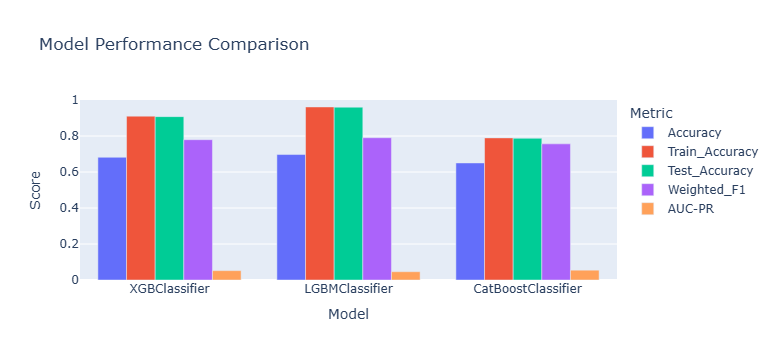

In [74]:
# Graph using plotly

fig = px.bar(clf_df_melted, 
             x = 'Model', 
             y = 'Score', 
             color = 'Metric',
             barmode = 'group',
             title = 'Model Performance Comparison')

fig.update_layout(yaxis_range = [0, 1])
fig.show()

Their scores look pretty similar in trend, but using the hover function of plotly, you can see that LightGBM dominates in all but one metric (its AUC-PR). In fact, its training and testing accuracies are above 90%! I am not entirely sure why these are so different than its general accuracy score (but that is still quite good, at a little under 70%). Compared to the regressors, these give me far more hope. Next, I would like to graph those PR curves. 

In [75]:
# Calculate y probabilities

xgbc_probs = xgbc_best.predict(X_clf_test)
lgbc_probs = lgbc_best.predict(X_clf_test)
cbc_probs = cbc_best.predict(X_clf_test_str)

# Put into dictionary for graphing

y_probs_clf = {
    'XGBoost Classifier': xgbc_probs,
    'LightGBM Classifier': lgbc_probs,
    'CatBoost Classifier': cbc_probs
}

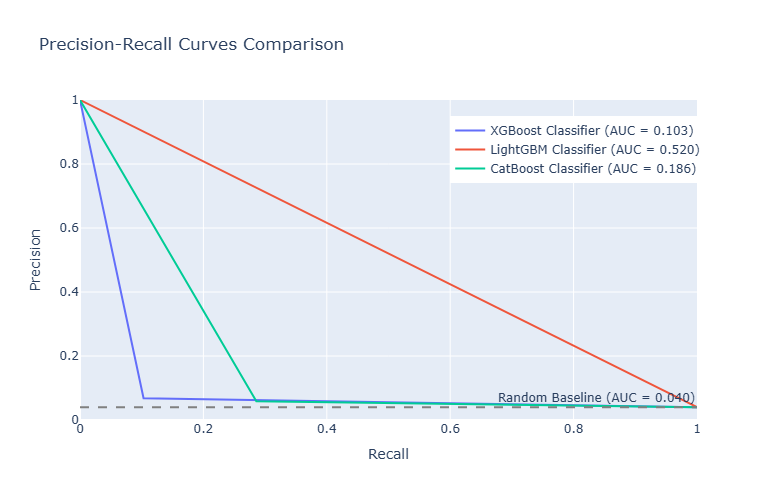

In [76]:
# Graphing the PR curves

fig = go.Figure()

# For loop to graph each classifier in the same graph

for model_name, y_proba in y_probs_clf.items():
    precision, recall, _ = precision_recall_curve(y_clf_test, y_proba)
    auc_pr = auc(recall, precision)
    
    fig.add_trace(go.Scatter(
        x = recall,
        y = precision,
        mode = 'lines',
        name = f'{model_name} (AUC = {auc_pr:.3f})',
        line = dict(width = 2)
    ))

# Add baseline (random classifier line) for comparison
positive_rate = np.mean(y_clf_test)  # The ~4% positive class rate
fig.add_hline(y = positive_rate, 
              line_dash = "dash", 
              line_color = "gray",
              annotation_text = f"Random Baseline (AUC = {positive_rate:.3f})")

# Customize layout
fig.update_layout(
    title = 'Precision-Recall Curves Comparison',
    xaxis_title = 'Recall',
    yaxis_title = 'Precision', 
    xaxis = dict(range = [0, 1]),
    yaxis = dict(range = [0, 1]),
    legend = dict(x = 0.6, y = 0.95),
    width = 700,
    height = 500
)

fig.show()

In [77]:
# Finally, use my ranking function to rank these

clf_ranked = rank_clfs(clf_full_results)


CLASSIFICATION MODEL RANKING
Ranking Results (lower score = better):
             Model  Weighted_F1  Accuracy  Accuracy_Gap  final_score
    LGBMClassifier       0.7902    0.6970        0.0014          8.0
     XGBClassifier       0.7794    0.6817        0.0028         11.0
CatBoostClassifier       0.7563    0.6503        0.0023         17.0


In just about every statistic, the LightGBM model has proven itself the winner. I am actually surprised the CatBoost model did so poorly, as I expected it to perform best. Regardless, with a relatively high accuracy and weighted F1, a far better PR curve, and all-around better results, the LightGBM Classifier is the best model. Now, onto final tuning!

## Final Tuning

In [78]:
# More complete parameter grid for LightGBM

param_grid = {
    'n_estimators': [100, 200, 300],  
    'learning_rate': [0.05, 0.1, 0.15],
    'max_depth': [3, 5, 7],
    'num_leaves': [15, 31, 50],  
    'min_child_samples': [10, 20, 30],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'reg_alpha': [0, 0.1, 0.5],  
    'reg_lambda': [0, 0.1, 0.5] 
}

In [79]:
# Initialize model for testing

lgbc_model = LGBMClassifier(
    objective = 'binary',
    metric = 'binary_logloss',
    class_weight = 'balanced',  # Because of imbalance
    random_state = 42,
    verbose = -1
)

In [80]:
# Create a scorer

pr_auc_scorer = make_scorer(average_precision_score)

In [81]:
# Create a final random search

random_search = RandomizedSearchCV(
    lgbc_model,
    param_distributions = param_grid,
    n_iter = 50,  
    cv = StratifiedKFold(n_splits = 3, shuffle = True, random_state = 42),  # 3-fold to save time
    scoring = pr_auc_scorer,
    n_jobs = -1,  # Use all CPU cores
    random_state = 42,
    verbose = 1
)

In [82]:
# Final tuning to maximize the model's scores

print("Starting tuning... this may take some time")
random_search.fit(X_clf_train_sample, y_clf_train_sample)

print("\nBest parameters:")
print(random_search.best_params_)
print(f"\nBest cross-validation AUC-PR: {random_search.best_score_:.4f}")

# Train final model on full training set with best params
lgbc_final = random_search.best_estimator_
lgbc_final.fit(X_clf_train, y_clf_train)

print("Tuning complete! Use 'lgbc_final' for predictions.")

Starting tuning... this may take some time
Fitting 3 folds for each of 50 candidates, totalling 150 fits

Best parameters:
{'subsample': 0.8, 'reg_lambda': 0.1, 'reg_alpha': 0, 'num_leaves': 15, 'n_estimators': 100, 'min_child_samples': 20, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.8}

Best cross-validation AUC-PR: 0.0525
Tuning complete! Use 'lgbc_final' for predictions.


In [83]:
# Final metric time, using the previous classification full evaluation function

lgbc_final_metrics = full_clf_eval(lgbc_final, X_clf_train, y_clf_train, X_clf_test, y_clf_test)

--- BASIC METRICS ---
CV Accuracy: 0.618 ± 0.004
CV F1 (Weighted): 0.732 ± 0.003
CV F1 (Macro): 0.435 ± 0.003

--- TRAIN/TEST SCORES AND GAPS ---
Train Accuracy: 0.619 | Test Accuracy: 0.619 | Gap: -0.001

--- FEATURE IMPORTANCE ANALYSIS ---
Top 5 most important features:
  1. Breed: 264.0000
  2. AgeYears: 178.0000
  3. Color: 137.0000
  4. IntakeMonth: 100.0000
  5. AnimalType_Dog: 13.0000

--- CLASS DISTRIBUTION COMPARISON ---
Class distribution comparison:
Class           Actual     Predicted  Difference
--------------------------------------------------
0               31030      19645      -11385++++
1               1291       12676      11385+++++

--- AUC-PR ANALYSIS ---
AUC-PR: 0.089
AUC-ROC: 0.677

--- CLASSIFICATION REPORT ---
              precision    recall  f1-score   support

           0       0.98      0.62      0.76     31030
           1       0.07      0.65      0.12      1291

    accuracy                           0.62     32321
   macro avg       0.52      0.63 

# Conclusion

The goal of this project was to compile two models together in order to predict both the outcome an animal was likely to receive and how long that outcome would likely take. Unfortunately, the regression models employed for the second piece are doing barely more than random guessing, so in the end, I have decided to leave them. The classification models, however (what outcome an animal was likely to receive) did fairly well. All said and done, I have chosen a LightGBM Classifier (lgbc_final) as my final model, as it significantly outclassed both other models (an XGBoost Classifier and a CatBoost Classifier). I am satisfied with the final model's performance, especially given the very random nature of adoptions (as witnessed by the poor regression models).

I believe that this, or something similar, could help shelters (in this case, Austin Animal Center in particular) predict which animals need extra help to be adopted and which don't, thereby increasing efficiency within the shelter and increasing turnover, which is necessary for a shelter to continue intaking pets. 

Some items of note:
- I did not use every variable possible, nor did I combine variables into more complex categories (e.g., compiling age + breed into a column which has categories such as "4 year old pitbull"). 
- I did not use timestamped data, merely the intake month and time stayed.
- I am uncertain whether a regressor model for this problem will ever be feasible, but I hope that someone more experienced than I is someday able to figure it out.
- I limited the animals I evaluated to dogs and cats, and ignored other species (to avoid introducing extra "noise" into the algorithms).
- I focused on a binary problem for the classification, that being a positive class consisting of the worst outcomes ("Euthanasia" and "Died") and a negative class of everything else (including not only "Adoption" but outcomes such as "Return to Owner" or "Transferred").
- There are certainly trends in animal adoption; however, there is also a very large amount of randomness, due to the human nature of this. Adoptions are not (usually) an analytical or straightforward decision, but more often emotional, driven by either pity, loneliness, or just the desire to take care of something or have an ever-present friend. One such example is the happenings of the early 2020s, when COVID hit. Austin Animal Center data saw a huge increase in adoption, as people were unable to socialize and therefore needed a furry (or scaly, or feathered) friend. Because of this emotional bias, adoptions will likely never be perfectly predicted; however, I did my best by this shelter, and I feel fairly good about what has resulted.
- Thank you for your interest in this project! I worked long and hard on it, but I am very new to data science. There are many things I could (and possibly should) have done differently (for example, I feel parts of this are over-complicated and rather obtuse), and those I will have to learn and revise as I grow as a data scientist. So rather than being the end-all, I hope this inspires someone more experienced than I to try their hand at this effort--make a difference for somebody.